# Logistic Regression: As a single Neuron

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from utils_logistic_regression import load_house_data, plot_house_data
from matplotlib.animation import FuncAnimation
from tqdm import tqdm

# Introduction

Logistic Regression is a supervised machine learning algorithm used for binary classification problems, where the target variable belongs to one of two classes:

$$
y \in \{0,1\}
$$

Unlike linear regression, which predicts continuous values, logistic regression predicts the probability that a sample belongs to a particular class. Therefore, the predicted output must always lie between 0 and 1.

The model first constructs a linear combination of the input features:

$$
Z = XW + b
$$

or for a single training sample,

$$
z_i=\sum_{j=1}^{m}w_jx_{ij}+b
$$

If we directly use \(Z\) as the prediction, similar to linear regression, the output can take any value between $-\infty$ and $+\infty$, leading to unphysical probabilities such as negative values or probabilities greater than 1.

To convert the linear output into a valid probability, logistic regression uses the sigmoid function:

$$
\hat y_i=\sigma(z_i)=\frac{1}{1+e^{-z_i}}
$$


The sigmoid function maps:

- large negative values to close to 0
- large positive values to close to 1

Thus, the prediction can be interpreted as a probability:

$$
P(y_i=1|x_i)=\hat y_i
$$

and therefore,

$$
P(y_i=0|x_i)=1-\hat y_i
$$

A decision boundary is obtained by choosing a threshold, typically ($\hat y_{i} = 0.5$ i.e. $z_{i} = 0$):

$$
\hat y_i \ge 0.5 \Rightarrow \text{Class 1}
$$

$$
\hat y_i < 0.5 \Rightarrow \text{Class 0}
$$

Since the sigmoid function is monotonic, the decision boundary occurs at

$$
z_i = 0
$$

which gives

$$
w^Tx+b=0
$$


Thus, logistic regression produces a linear decision boundary in the feature space while predicting nonlinear probabilities through the sigmoid transformation.
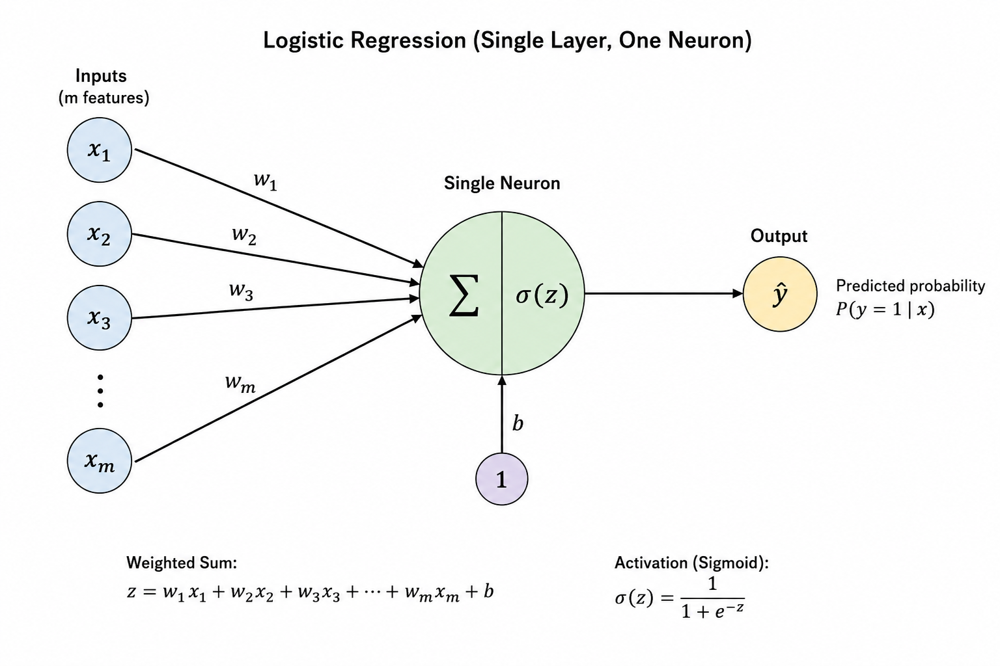

### Why use the sigmoid function?

The sigmoid function maps any real-valued input to the interval (0,1), so its output can be interpreted as a probability. It is also continuous and differentiable.
However, the sigmoid is not the only function that maps values to (0,1). The important motivation for logistic regression comes from modelling the **log-odds** as a linear function of the features.

### Log-Odds / Logits

The **odds** compare the probability of success to the probability of failure:

$$
\mathrm{odds}
=
\frac{p}{1-p}
$$

Since

$$
0 < p < 1,
$$

the odds range from 0 to +$\infty$:

$$
\mathrm{odds}\in(0,+\infty)
$$

Taking the logarithm gives the **log-odds**, also called the **logit**:

$$
\mathrm{logit}(p)
=
\log\left(\frac{p}{1-p}\right)
$$

The logit maps the probability from \((0,1)\) to the entire real line:

$$
\mathrm{logit}(p)\in(-\infty,+\infty)
$$

which has the same range as the linear predictor

$$
z=x^Tw+b.
$$

The log-odds also have a natural interpretation:

$$
p=0.5
\quad\Longrightarrow\quad
\mathrm{logit}(p)=0
$$

$$
p>0.5
\quad\Longrightarrow\quad
\mathrm{logit}(p)>0
$$

$$
p<0.5
\quad\Longrightarrow\quad
\mathrm{logit}(p)<0.
$$

Thus, positive values favor class \(1\), while negative values favor class \(0\).

### Why assume the log-odds are linear?

This is a **modeling assumption**, similar to assuming that the response is a linear function of the features in linear regression.

We assume that the log-odds have a linear relationship with the input features:

$$
\log\left(\frac{p}{1-p}\right)
=
x^Tw+b
=
z.
$$

This transformation is useful because it maps probabilities from \((0,1)\) to the entire real line, is symmetric around \(p=0.5\), and converts multiplicative effects on the odds into additive effects on the log-odds.

Starting from

$$
\log\left(\frac{p}{1-p}\right)=z
$$

we exponentiate both sides:

$$
\frac{p}{1-p}=e^z
$$

Solving for \(p\),

$$
p=e^z(1-p)
$$

$$
p=e^z-e^zp
$$

$$
p(1+e^z)=e^z
$$

$$
p=\frac{e^z}{1+e^z}
$$

or equivalently,

$$
p=\frac{1}{1+e^{-z}}.
$$

Therefore, the sigmoid function naturally appears as the inverse of the logit transformation:

$$
\boxed{
p=\sigma(z)=\frac{1}{1+e^{-z}}
}
$$

where

$$
z=x^Tw+b.
$$

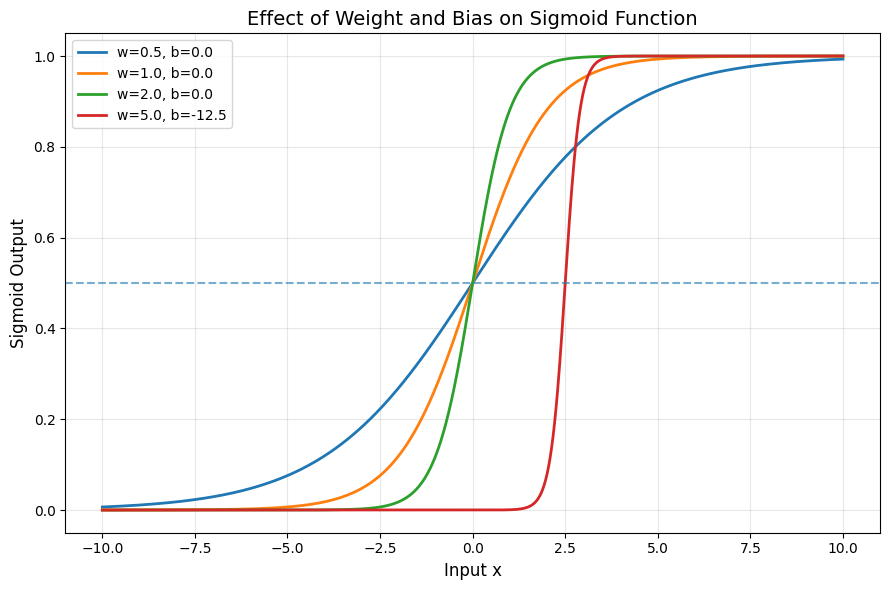

In [2]:
# Sigmoidal function

# Input values
x = np.linspace(-10, 10, 1000)

# Sigmoid function
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

# Different weights and biases
weights = [0.5,1.0,2.0,5.0]
bias = [0.0,0.0,0.0,-12.5]

# Note the offset will be bias/weights = 12.5/5 = 2.5

plt.figure(figsize=(9,6))

for w, b in zip(weights,bias):

    z = w * x + b
    y = sigmoid(z)

    plt.plot(x,y,linewidth=2,label=f"w={w}, b={b}")

# Decision boundary
plt.axhline(0.5, linestyle='--', alpha=0.6)

plt.xlabel("Input x", fontsize=12)
plt.ylabel("Sigmoid Output", fontsize=12)
plt.title("Effect of Weight and Bias on Sigmoid Function", fontsize=14)

plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()

plt.show()

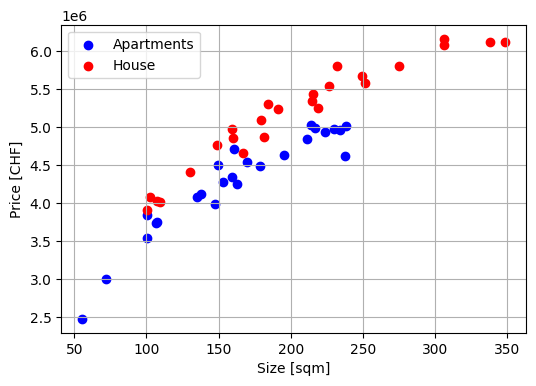

In [3]:
# Import dataset
sizes, prices, labels = load_house_data()
plot_house_data(sizes, prices, labels)


1.3322676295501878e-16 1.0


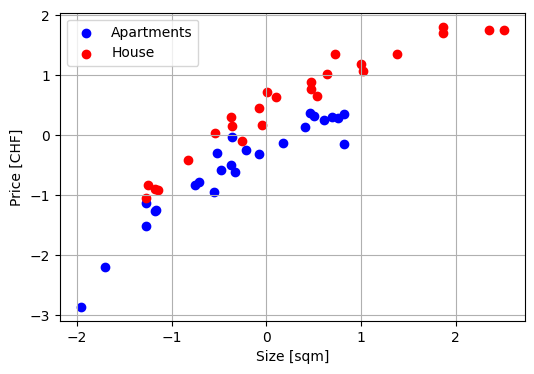

In [4]:
# Scale the input features
sizes_scaled = (sizes - np.mean(sizes)) / np.std(sizes)
prices_scaled = (prices - np.mean(prices)) / np.std(prices)
print(sizes_scaled.mean(),sizes_scaled.std())

plot_house_data(sizes_scaled, prices_scaled, labels)


In [5]:
# Create a list of features for nonlinear discission boundary
features = [
    sizes_scaled, 
    prices_scaled,
    sizes_scaled**2, 
    prices_scaled**2
]

feature_names = ['size', 'price', 'size²', 'price²']

feature_matrix = np.array(features).T # feature_matrix.reshape(data_size,n_features) (n_features,1) = (data_size,1)
print(feature_matrix.shape)
print(feature_matrix[:5])

(50, 4)
[[ 0.6953511   0.30509956  0.48351315  0.09308574]
 [ 0.50049858  0.31901919  0.25049883  0.10177324]
 [ 0.75850412  0.28449612  0.5753285   0.08093804]
 [-0.47368166 -0.58674042  0.22437431  0.34426432]
 [ 0.4134251   0.13460522  0.17092031  0.01811856]]


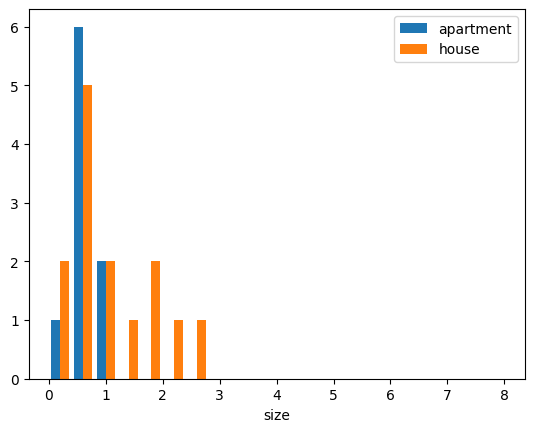

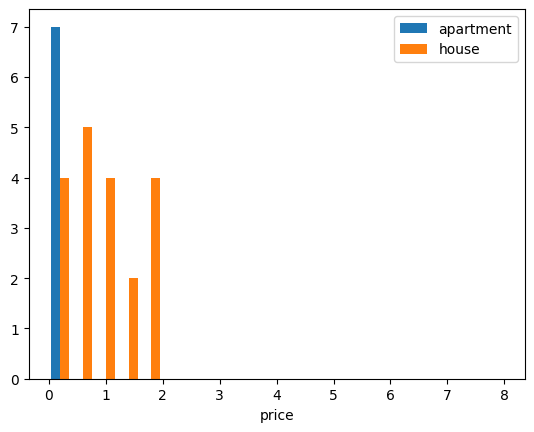

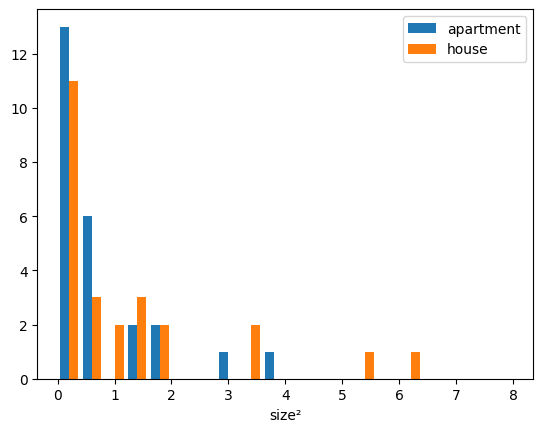

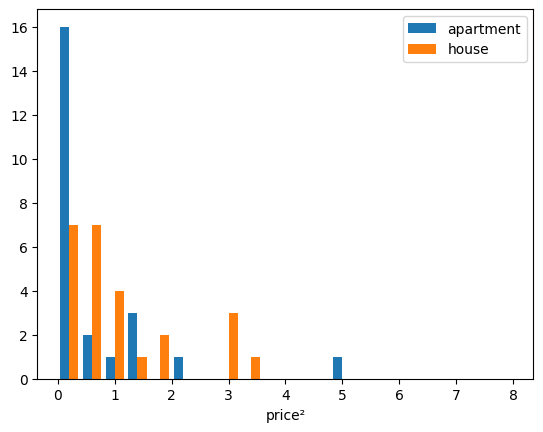

In [6]:
# Feature Plots
for i,feature in enumerate(features):
    apartment = feature[labels==0]
    house = feature[labels==1]  
    plt.hist([apartment,house],bins=20,range=[0,8],label=['apartment','house'])
    plt.legend()
    plt.xlabel(feature_names[i])
    plt.show()

# Cross-Entropy Loss as a Likelihood Function

In binary classification, the target variable belongs to one of two classes, $(y_i \in \{0,1\}$).

For a given input $(x_i)$, logistic regression predicts the probability of class ($1$) using the sigmoid function:

$$
\hat y_i = \sigma(z_i)=\frac{1}{1+e^{-z_i}}
$$

where $(z_i = wx_i + b$).


Since there are only two possible outcomes:

- probability of class $(1$) is $\hat y_i$
- probability of class $(0$) is $1-\hat y_i$

Both cases can be combined into a single Bernoulli likelihood expression:

$$
P(y_i \mid x_i)=\hat y_i^{\,y_i}(1-\hat y_i)^{\,1-y_i}
$$

This compact form works because:

- if $(y_i = 1$), then $(P(y_i|x_i)=\hat y_i$)
- if $(y_i = 0$), then $(P(y_i|x_i)=1-\hat y_i$)

Assuming all training samples are independent, the likelihood for the full dataset becomes

$$
L
=
\prod_{i=1}^{N}
\hat y_i^{\,y_i}(1-\hat y_i)^{\,1-y_i}
$$

Taking the logarithm gives the log-likelihood:

$$
\log L
=
\sum_{i=1}^{N}
\left[
y_i\log(\hat y_i)
+
(1-y_i)\log(1-\hat y_i)
\right]
$$

In Maximum Likelihood Estimation (MLE), we seek parameters that maximize this log-likelihood. Equivalently, we minimize the negative log-likelihood, leading to the Binary Cross-Entropy (BCE) loss:

$$
J
=
-\frac{1}{N}
\sum_{i=1}^{N}
\left[
y_i \log(\hat y_i)
+
(1-y_i)\log(1-\hat y_i)
\right]
$$


Thus, the Binary Cross-Entropy loss is simply the negative log-likelihood of a Bernoulli probability model.

# Gradients of Binary Cross-Entropy (BCE) Loss

The Binary Cross-Entropy loss is

$$
J=-\frac{1}{N}\sum_{i=1}^{N}\left[y_i\log(\hat y_i)+(1-y_i)\log(1-\hat y_i)\right]
$$

with

$$
\hat y_i=\sigma(z_i)=\frac{1}{1+e^{-z_i}}
$$


The linear model is

$$
z_i=\sum_{j=1}^{m}w_jx_{ij}+b
$$

or in matrix form

$$
Z_{n\times1}=X_{n\times m}W_{m\times1}+b
$$

where $n$ is the number of training samples and $m$ is the number of features.

For a single training sample,

$$
J_i=-\left[y_i\log(\hat y_i)+(1-y_i)\log(1-\hat y_i)\right]
$$

Using the chain rule,

$$
\frac{\partial J_i}{\partial w_j}
=
\frac{\partial J_i}{\partial \hat y_i}
\frac{\partial \hat y_i}{\partial z_i}
\frac{\partial z_i}{\partial w_j}
$$
and, 
$$
\frac{\partial J_i}{\partial b}
=
\frac{\partial J_i}{\partial \hat y_i}
\frac{\partial \hat y_i}{\partial z_i}
\frac{\partial z_i}{\partial b}
$$


Differentiating with respect to $(\hat y_i$),

$$
\frac{\partial J_i}{\partial \hat y_i}
=
-\left[\frac{y_i}{\hat y_i}-\frac{1-y_i}{1-\hat y_i}\right]
=
\frac{\hat y_i-y_i}{\hat y_i(1-\hat y_i)}
$$

The sigmoid derivative is

$$
\frac{\partial \hat y_i}{\partial z_i}
=
\hat y_i(1-\hat y_i)
$$


Since

$$
z_i=\sum_{j=1}^{m}w_jx_{ij}+b
$$

we get

$$
\frac{\partial z_i}{\partial w_j}=x_{ij},
\qquad
\frac{\partial z_i}{\partial b}=1
$$


Substituting all terms,

$$
\frac{\partial J_i}{\partial w_j}
=
\left(
\frac{\hat y_i-y_i}{\hat y_i(1-\hat y_i)}
\right)
\left(
\hat y_i(1-\hat y_i)
\right)
x_{ij}
=
(\hat y_i-y_i)x_{ij}
$$

Similarly,

$$
\frac{\partial J_i}{\partial b}
=
\hat y_i-y_i
$$


Averaging over all samples,

$$
\frac{\partial J}{\partial w_j}
=
\frac{1}{N}\sum_{i=1}^{N}(\hat y_i-y_i)x_{ij}
$$

$$
\frac{\partial J}{\partial b}
=
\frac{1}{N}\sum_{i=1}^{N}(\hat y_i-y_i)
$$

In Matrix form:

$$
\hat Y=
\begin{bmatrix}
\hat y_1\\
\hat y_2\\
\vdots\\
\hat y_N
\end{bmatrix},
\qquad
Y=
\begin{bmatrix}
y_1\\
y_2\\
\vdots\\
y_N
\end{bmatrix}
$$

Then the gradient with respect to the weight vector is

$$
\frac{\partial J}{\partial W}
=
\frac{1}{N}X^T(\hat Y-Y)
$$


and for the bias

$$
\frac{\partial J}{\partial b}
=
\frac{1}{N}\sum_{i=1}^{N}(\hat y_i-y_i)
$$

The parameters are updated using gradient descent:

$$
W \leftarrow W-\eta\frac{\partial J}{\partial W},
\qquad
b \leftarrow b-\eta\frac{\partial J}{\partial b}
$$

where $(\eta$) is the learning rate.



## Why Cross-Entropy Works

The loss becomes very small when the prediction is correct and confident:
- If $y_i=1$ (true class = signal) and $\hat y_i \approx 1$ (predicted as signal), or if $y_i=0$ (true class = background) and $\hat y_i \approx 0$ (predicted as background), the loss is very small.

- However, when the prediction is confidently wrong, i.e. $y_i=1,\ \hat y_i \to 0$ or $y_i=0,\ \hat y_i \to 1$$, the loss becomes very large.

This happens because $ \log(0)\to -\infty $

Thus, cross-entropy heavily penalizes incorrect predictions. Note that terms such as $ x\log x $ remain well-defined near zero since

$$
\lim_{x\to0^+} x\log x = 0
$$


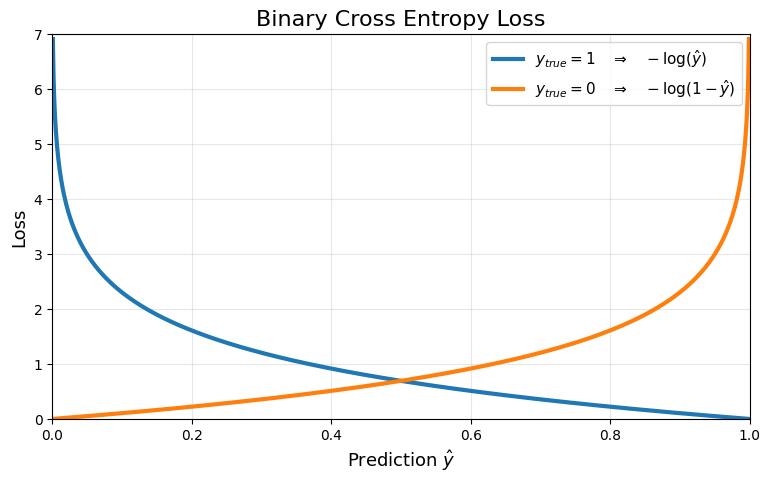

In [7]:
y_pred = np.linspace(0.001, 0.999, 1000) # output of sigmoid fucntion [0,1]

loss_true_1 = -np.log(y_pred)          # when y_true = 1
loss_true_0 = -np.log(1 - y_pred)     # when y_true = 0

plt.figure(figsize=(9, 5))

plt.plot(y_pred, loss_true_1,
         linewidth=3,
         label=r"$y_{true}=1 \quad \Rightarrow \quad -\log(\hat{y})$")

plt.plot(y_pred, loss_true_0,
         linewidth=3,
         label=r"$y_{true}=0 \quad \Rightarrow \quad -\log(1-\hat{y})$")


plt.xlabel(r"Prediction $\hat{y}$", fontsize=13)
plt.ylabel("Loss", fontsize=13)
plt.title("Binary Cross Entropy Loss", fontsize=16)
plt.xlim(0, 1)
plt.ylim(0, 7)
plt.grid(alpha=0.3)
plt.legend(fontsize=11)
plt.show()


In [8]:
# feature_matrix.reshape(data_size,n_features) (n_features,1) = (data_size,1)
print(type(feature_matrix))

# Calculate logistic regression loss (binary corss-entropy)
def sigmoid(z):
    z = np.clip(z, -500, 500)
    s = 1 / (1 + np.exp(-z))
    return s

def calculate_logistic_loss(weights, bias, feature_matrix, labels):
    
    z = feature_matrix @ weights + bias 
    y_pred = sigmoid(z)
   
    loss = -np.mean(labels * np.log(y_pred) + (1 - labels) * (np.log(1 - y_pred)))
    
    return loss
    
def gradient_descent_logistic(feature_matrix, labels, learning_rate = 0.05, n_iterations=20): # feature matrix is already transposed

    # Initialize parameters
    weights = np.zeros(feature_matrix.shape[1])  # array(n_features,)
    bias = 0.0 # scalar
    
    # Store path (Using list since it can be appended)
    w_path = [weights.copy()]
    b_path = [bias]
    loss_path = [calculate_logistic_loss(weights, bias, feature_matrix, labels)]

    
    for i in range(n_iterations):
        
        z = feature_matrix @ weights + bias
        y_pred = sigmoid(z)
    
        # Calculate gradients [Using sigmoidal function results in very simple form]
       
        dw = (1 / len(labels)) * ( feature_matrix.T @ (y_pred - labels) ) #?? dJ/dwj = -1/N Sum i (y_i - ypred_i) x_ij
        db = np.mean(y_pred - labels)

        
        # Update
        weights -= learning_rate * dw
        bias -= learning_rate * db

        # Append
        w_path.append(weights.copy())
        b_path.append(bias)
        loss_path.append(calculate_logistic_loss(weights, bias, feature_matrix, labels))
    
    
    return np.array(w_path), np.array(b_path), np.array(loss_path) # convert to array
        
def evaluate_logistic(weights, bias, test_data):
    z = test_data @ weights + bias
    y_pred = sigmoid(z)
    return y_pred

<class 'numpy.ndarray'>


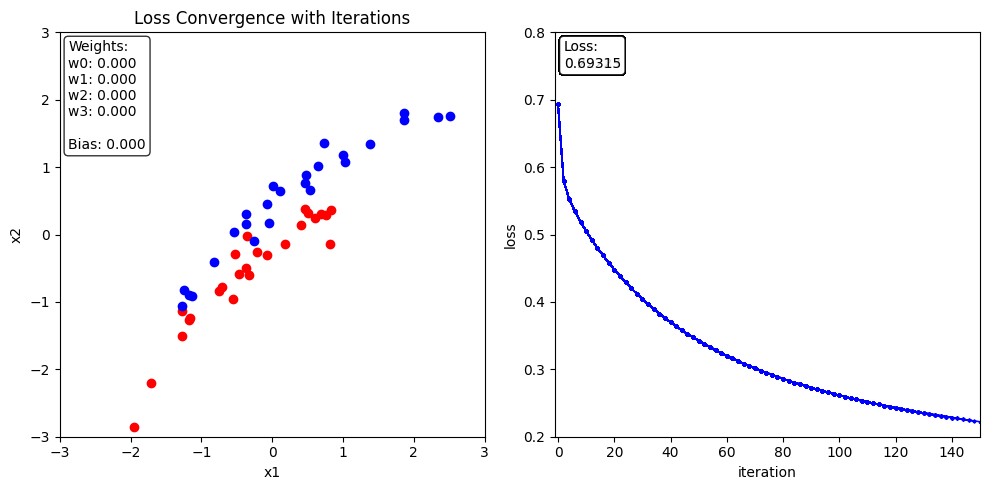

In [9]:
w_path, b_path, loss_path = gradient_descent_logistic(feature_matrix, labels, learning_rate = 1.0, n_iterations=150)

# ---------------------------------------
# Create mesh grid
# ---------------------------------------
x1 = np.linspace(-3, 3, 200)
x2 = np.linspace(-3, 3, 200)

X1, X2 = np.meshgrid(x1, x2)

x1_flat = X1.ravel()
x2_flat = X2.ravel()

# Nonlinear features
grid = np.c_[x1_flat,x2_flat,x1_flat**2,x2_flat**2]

fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(1,2,1)

ax2 = fig.add_subplot(1,2,2)

mask = labels == 0

feat1_data = feature_matrix[:,0]
feat2_data = feature_matrix[:,1]

# ---------------------------------------
# Animation function
# ---------------------------------------


def update(frame):

    ax1.clear()
    
    w = w_path[frame]
    b = b_path[frame]

    Z = evaluate_logistic(w, b, grid)
    Z = Z.reshape(X1.shape)

    # Data points
    ax1.scatter(feat1_data[mask], feat2_data[mask], color='red', label='Apartments')
    ax1.scatter(feat1_data[~mask], feat2_data[~mask], color='blue', label='House')

    # Decision boundary
    ax1.contour(X1, X2, Z, levels=[0.5], colors='black', linewidths=2)

    ax1.set_xlim(-3,3)
    ax1.set_ylim(-3,3)
    ax1.set_xlabel('x1')
    ax1.set_ylabel('x2')
    ax1.set_title(f"Iteration {frame}")
    
    ax2.plot(np.arange(frame + 1)[::2],loss_path[:frame + 1][::2],'b-o',linewidth=1,markersize=1.5,alpha=0.8)
    ax2.set_xlabel('iteration')
    ax2.set_ylabel('loss')
    ax1.set_title(f"Loss Convergence with Iterations")
    ax2.set_xlim(-1,150)
    ax2.set_ylim(0.2,0.8)

    plt.tight_layout()

    
    w_string = "\n".join(
        [f"w{i}: {val:.3f}" for i, val in enumerate(w)]
    )

    ax1.text(
        0.02, 0.98,
        f"Weights:\n{w_string}\n\nBias: {b_path[frame]:.3f}",
        transform=ax1.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.8)
    )

    # ----- loss -----
    ax2.text(
        0.02, 0.98,
        f"Loss:\n{loss_path[frame]:.5f}",
        transform=ax2.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.8)
    )

# ---------------------------------------
# Animate
# ---------------------------------------

anim = FuncAnimation(fig,update,frames=len(w_path),interval=100)
anim.save("logistic_boundary.gif")
from IPython.display import HTML
HTML(anim.to_jshtml())


In [10]:
# Here, with nonlinear input features, the model prediction becomes unphysical because the predicted price decreases as the size increases,
# which is generally not expected in real scenarios. This behavior is likely caused by the lack of training data at larger
# values of the input feature, leading to poor extrapolation outside the observed data range

In [11]:
#save_path="logistic-boundary-animation.mp4"
#anim.save(save_path)

In [12]:
w_path[-1]

array([-3.84674548,  5.44233562,  1.4772271 , -0.16984594])

In [13]:
b_path[-1]

np.float64(-1.0091913662848375)

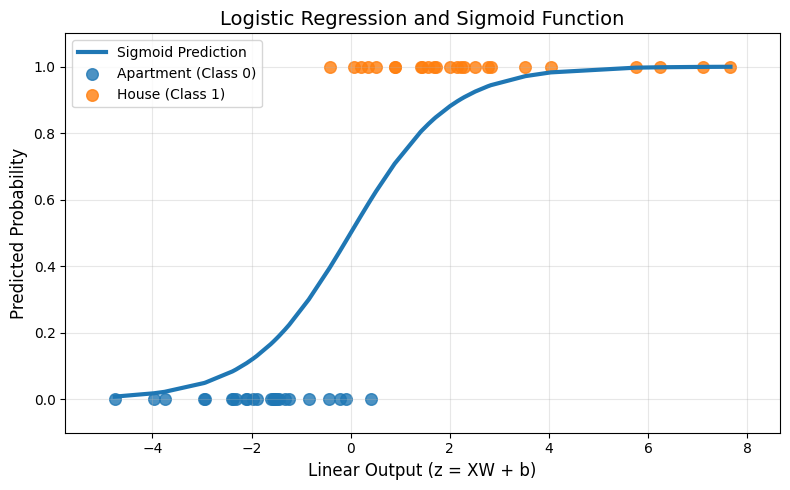

In [14]:
# Predictions
z = feature_matrix @ w_path[-1] + b_path[-1]
y_pred = sigmoid(z)

# Sort values for smooth sigmoid curve
idx = np.argsort(z)
z_sorted = z[idx]
y_sorted = y_pred[idx]

# Create figure
plt.figure(figsize=(8,5))

# Sigmoid curve
plt.plot(z_sorted, y_sorted, linewidth=3, label='Sigmoid Prediction')

# Scatter points for true labels
plt.scatter(
    z[labels == 0],
    labels[labels == 0],
    s=70,
    alpha=0.8,
    label='Apartment (Class 0)'
)

plt.scatter(
    z[labels == 1],
    labels[labels == 1],
    s=70,
    alpha=0.8,
    label='House (Class 1)'
)


# Labels and styling
plt.xlabel("Linear Output (z = XW + b)", fontsize=12)
plt.ylabel("Predicted Probability", fontsize=12)
plt.title("Logistic Regression and Sigmoid Function", fontsize=14)

plt.xlim(min(z)-1, max(z)+1)
plt.ylim(-0.1, 1.1)

plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()

plt.show()

# Multinomial Logistic Regression

The output variable (y) belongs to more than two classes: $y \in {1,2,\ldots,K}.$
For example,
$$
y\in{\text{electron},\text{muon},\text{pion}},
$$

or, in the Iris dataset,

$$
y\in{\text{setosa},\text{versicolor},\text{virginica}}.
$$

It turns out that we can extend binary logistic regression to the multiclass case.

For this, we choose one class as a **reference (baseline) class**. The choice of the reference class is arbitrary and does not change the final predicted probabilities or decision boundaries. However, a particular class may be chosen for convenience or interpretability. For example, if pions are considered the background, we may naturally choose pions as the reference class.

In general, we choose the K-th class as the reference. Just as in binary logistic regression, where we model the log-odds as a linear function of the features, in the multiclass case we model the **log-odds of each class relative to the reference class** as a linear function:

$$
\log\left(
\frac{P(y=k\mid x_i)}
{P(y=K\mid x_i)}
\right)
=
z_k
=
w_k^T x_i+b_k,
\qquad k=1,\ldots,K-1.
$$

Thus, for (K) classes, we have (K-1) independent log-odds equations, since the (K)-th class serves as the reference.


### Multiclass Logistic Regression in Matrix Form

Suppose we have (N) samples, (D) features, and (K) classes.

The input data are represented by a 2D matrix (X), where rows correspond to observations and columns correspond to features:

$$
X=
\begin{pmatrix}
x_{11} & x_{12} & \cdots & x_{1D}\\
x_{21} & x_{22} & \cdots & x_{2D}\\
\vdots & \vdots & \ddots & \vdots\\
x_{N1} & x_{N2} & \cdots & x_{ND}
\end{pmatrix}
\in\mathbb{R}^{N\times D}.
$$

The output variable can take (K) different values:

$$
y\in{1,2,\ldots,K}.
$$

For each class (k), we have (D) weights and one bias:
$$
W=
\begin{pmatrix}
w_{11} & w_{12} & \cdots & w_{1K}\\
w_{21} & w_{22} & \cdots & w_{2K}\\
\vdots & \vdots & \ddots & \vdots\\
w_{D1} & w_{D2} & \cdots & w_{DK}
\end{pmatrix}
\in\mathbb{R}^{D\times K},
$$

and

$$
b=
\begin{pmatrix}
b_1 & b_2 & \cdots & b_K
\end{pmatrix}
\in\mathbb{R}^{1\times K}.
$$

For class (k), the score of ith sample is

$$
z_{ik}
=
x_{i1}w_{1k}
+x_{i2}w_{2k}
+\cdots
+x_{iD}w_{Dk}
+b_k.
$$

Equivalently,

$$
z_{ik}
=
\sum_{j=1}^{D}x_{ij}w_{jk}+b_k.
$$

Rather than calculating each $(z_{ik})$ separately, we calculate all scores simultaneously using matrix multiplication:

$$
\boxed{
Z=XW+b
}
$$

where

$$
X\in\mathbb{R}^{N\times D},
\qquad
W\in\mathbb{R}^{D\times K},
\qquad
b\in\mathbb{R}^{1\times K}.
$$

Therefore,

$$
Z\in\mathbb{R}^{N\times K}.
$$

Explicitly,

$$
Z=
\begin{pmatrix}
z_{11} & z_{12} & \cdots & z_{1K}\\
z_{21} & z_{22} & \cdots & z_{2K}\\
\vdots & \vdots & \ddots & \vdots\\
z_{N1} & z_{N2} & \cdots & z_{NK}
\end{pmatrix}.
$$

The Z matrix contains the **linear scores (logits)** for every observation and every class. These scores are then converted into probabilities using the softmax function. The last column is set to zero since it is refrence class.

Starting from the log-odds relative to the reference class (K),

$$
\log\left(\frac{P_{ik}}{P_{iK}}\right)=z_{ik},
\qquad k=1,\ldots,K-1.
$$

Exponentiating both sides,

$$
P_{ik}=P_{iK}e^{z_{ik}}.
$$

Since the probabilities of all (K) classes must sum to one,

$$
P_{i1}+P_{i2}+\cdots+P_{i,K-1}+P_{iK}=1.
$$

Substituting

$$
P_{ik}=P_{iK}e^{z_{ik}},
$$

we obtain

$$
P_{iK}
\left(
e^{z_{i1}}+e^{z_{i2}}+\cdots+e^{z_{i,K-1}}+1
\right)=1.
$$

Therefore, the probability of the reference class is

$$
\boxed{
P_{iK}
=
\frac{1}
{1+\displaystyle\sum_{j=1}^{K-1}e^{z_{ij}}}
}.
$$

For the other (K-1) classes,

$$
\boxed{
P_{ik}
=
\frac{e^{z_{ik}}}
{1+\displaystyle\sum_{j=1}^{K-1}e^{z_{ij}}},
\qquad k=1,\ldots,K-1.
}
$$

We can combine both expressions by defining the score of the reference class to be

$$
z_{iK}=0.\quad \text{( Thus the last column in Z is zero.)}
$$


Then

$$
e^{z_{iK}}=1,
$$

and the probabilities of all (K) classes can be written in the same form:

$$
\boxed{
P_{ik}
=
\frac{e^{z_{ik}}}
{\displaystyle\sum_{j=1}^{K}e^{z_{ij}}},
\qquad k=1,\ldots,K.
}
$$

This is the **softmax function**.

Thus, the complete probability matrix is
$$
P=
\begin{pmatrix}
P_{11} & P_{12} & \cdots & P_{1K}\\
P_{21} & P_{22} & \cdots & P_{2K}\\
\vdots & \vdots & \ddots & \vdots\\
P_{N1} & P_{N2} & \cdots & P_{NK}
\end{pmatrix}
\in\mathbb{R}^{N\times K},
$$
with each column adding to 1.


For N samples and K classes, we convert each target variable $y_i$ into a row of the target matrix $Y$. The position corresponding to the true class is set to 1, while all other positions are set to 0.

$$
Y \in \mathbb{R}^{N\times K}
$$

For example, for K=3,

$$
y_i=2
\quad\longrightarrow\quad
Y_i=
\begin{pmatrix}
0 & 1 & 0
\end{pmatrix}
$$

Thus, each row of Y contains exactly one 1:

$$
\sum_{k=1}^{K}Y_{ik}=1
$$


Now, for the N independent samples, the likelihood is

$$
L
=
\prod_{i=1}^{N}
\prod_{k=1}^{K}
P_{ik}^{Y_{ik}}.
$$

Taking the negative logarithm, we obtain the negative log-likelihood:

$$
L
=
-\sum_{i=1}^{N}
\sum_{k=1}^{K}
Y_{ik}\log(P_{ik}).
$$

Using the softmax expression,

$$
P_{ik}
=
\frac{e^{z_{ik}}}
{\displaystyle\sum_{j=1}^{K}e^{z_{ij}}},
$$

we have

$$
\log P_{ik}
=
z_{ik}
-
\log\left(
\sum_{j=1}^{K}e^{z_{ij}}
\right).
$$

Substituting this into the negative log-likelihood,

$$
L
=
-\sum_{i=1}^{N}
\sum_{k=1}^{K}
Y_{ik}
\left[
z_{ik}
-
\log\left(
\sum_{j=1}^{K}e^{z_{ij}}
\right)
\right].
$$

Expanding,

$$
L
=
-\sum_{i=1}^{N}
\sum_{k=1}^{K}
Y_{ik}z_{ik}
+
\sum_{i=1}^{N}
\sum_{k=1}^{K}
Y_{ik}
\log\left(
\sum_{j=1}^{K}e^{z_{ij}}
\right).
$$

The logarithmic term does not depend on (k), so we can write

$$
L
=
-\sum_{i=1}^{N}
\sum_{k=1}^{K}
Y_{ik}z_{ik}
+
\sum_{i=1}^{N}
\left(
\sum_{k=1}^{K}Y_{ik}
\right)
\log\left(
\sum_{j=1}^{K}e^{z_{ij}}
\right).
$$

Since,

$$
\sum_{k=1}^{K}Y_{ik}=1
$$

for every observation (i). Therefore,

$$
\boxed{
L
=
-\sum_{i=1}^{N}
\sum_{k=1}^{K}
Y_{ik}z_{ik}
+
\sum_{i=1}^{N}
\log\left(
\sum_{j=1}^{K}e^{z_{ij}}
\right)
}.
$$


### Gradient with respect to $z_{ik}$:
We use the **mean negative log-likelihood**:

$$
L
=
-\frac{1}{N}
\sum_{i'=1}^{N}
\sum_{k'=1}^{K}
Y_{i'k'}z_{i'k'}
+
\frac{1}{N}
\sum_{i'=1}^{N}
\log\left(
\sum_{j=1}^{K}e^{z_{i'j}}
\right).
$$

We now take the derivative with respect to $z_{ik}$.

For the first term,

$$
\frac{\partial}{\partial z_{ik}}
\left[
-\frac{1}{N}
\sum_{i'=1}^{N}
\sum_{k'=1}^{K}
Y_{i'k'}z_{i'k'}
\right]
=
-\frac{Y_{ik}}{N}.
$$

For the second term,

$$
\frac{\partial}{\partial z_{ik}}
\left[
\frac{1}{N}
\sum_{i'=1}^{N}
\log\left(
\sum_{j=1}^{K}e^{z_{i'j}}
\right)
\right].
$$

Using the chain rule,

$$
\frac{1}{N}
\frac{1}
{\displaystyle\sum_{j=1}^{K}e^{z_{ij}}}
\frac{\partial}
{\partial z_{ik}}
\left(
\sum_{j=1}^{K}e^{z_{ij}}
\right).
$$

Therefore,

$$
\frac{\partial}
{\partial z_{ik}}
\left(
\sum_{j=1}^{K}e^{z_{ij}}
\right)
=
e^{z_{ik}}.
$$

Hence, the derivative of the second term is

$$
\frac{1}{N}
\frac{e^{z_{ik}}}
{\displaystyle\sum_{j=1}^{K}e^{z_{ij}}}.
$$

Recognizing the softmax probability,

$$
P_{ik}
=
\frac{e^{z_{ik}}}
{\displaystyle\sum_{j=1}^{K}e^{z_{ij}}},
$$

we obtain

$$
\frac{\partial L}{\partial z_{ik}}
=
-\frac{Y_{ik}}{N}
+
\frac{P_{ik}}{N}.
$$

Therefore,

$$
\boxed{
\frac{\partial L}{\partial z_{ik}}
=
\frac{P_{ik}-Y_{ik}}{N}
}
$$

Defining

$$
G_{ik}
=
\frac{\partial L}{\partial z_{ik}},
$$

we have

$$
\boxed{
G_{ik}
=
\frac{P_{ik}-Y_{ik}}{N}.
}
$$


### Gradient with respect to W:

We have

$$
z_{i'k}
=
\sum_{j'=1}^{D}x_{i'j'}w_{j'k}+b_k.
$$

Using the chain rule,

$$
\frac{\partial L}{\partial w_{jk}}
=
\sum_{i'=1}^{N}
\frac{\partial L}{\partial z_{i'k}}
\frac{\partial z_{i'k}}{\partial w_{jk}}.
$$

Since

$$
\frac{\partial z_{i'k}}{\partial w_{jk}}
=
x_{i'j},
$$

and

$$
G_{i'k}
=
\frac{\partial L}{\partial z_{i'k}},
$$

we obtain

$$
\frac{\partial L}{\partial w_{jk}}
=
\sum_{i'=1}^{N}
G_{i'k}x_{i'j}.
$$

This is exactly the (j,k) th element of (X^T G). Therefore,

$$
\boxed{
\frac{\partial L}{\partial W}
=
X^TG
}
$$

Since

$$
G=\frac{P-Y}{N},
$$

we have

$$
\boxed{
dW
=
\frac{\partial L}{\partial W}
X^T\frac{P-Y}{N}
}
$$

with

$$
X\in\mathbb{R}^{N\times D},
\qquad
G\in\mathbb{R}^{N\times K},
\qquad
dW\in\mathbb{R}^{D\times K}.
$$

### Gradient with respect to b:

Using the chain rule,

$$
\frac{\partial L}{\partial b_k}
=
\sum_{i'=1}^{N}
\frac{\partial L}{\partial z_{i'k}}
\frac{\partial z_{i'k}}{\partial b_k}.
$$

Since

$$
\frac{\partial z_{i'k}}{\partial b_k}=1,
$$

we obtain

$$
\frac{\partial L}{\partial b_k}
=
\sum_{i'=1}^{N}G_{i'k}.
$$

Therefore, in matrix form,

$$
\boxed{
db
=
\frac{\partial L}{\partial b}
=
\sum_{i'=1}^{N}G_{i'}
}
$$

or, substituting G,

$$
\boxed{
db
=
\frac{1}{N}
\sum_{i'=1}^{N}
(P_{i'}-Y_{i'})
}
$$

and equivalently,

$$
\boxed{
db
=
\frac{1}{N}
\sum_{i'=1}^{N}
(P_{i',:}-Y_{i',:})
}
$$

where

$$
db\in\mathbb{R}^{1\times K}.
$$

Thus the two parameter gradients are

$$
\boxed{
dW=X^T\frac{P-Y}{N}
}
$$

and

$$
\boxed{
db=
\frac{1}{N}
\sum_{i'=1}^{N}
(P_{i',:}-Y_{i',:})
}.
$$


## Multiclass Logistic Regression - Final Formulas

For N samples, D features and K classes:

$$
X:(N,D),\qquad
W:(D,K),\qquad
b:(1,K),\qquad
Y:(N,K).
$$

### Forward pass

$$
\boxed{Z=XW+b}
\qquad
Z:(N,K)
$$

$$
\boxed{
P_{ik}
=
\frac{e^{z_{ik}}}
{\displaystyle\sum_{j=1}^{K}e^{z_{ij}}}
}
\qquad
P:(N,K)
$$

### Loss

$$
\boxed{
L=
-\frac{1}{N}
\sum_{i=1}^{N}
\sum_{k=1}^{K}
Y_{ik}\log P_{ik}
}
$$

### Gradients

$$
\boxed{
G =\frac{\partial L}{\partial Z}
=
\frac{P-Y}{N}
}
\qquad
G:(N,K)
$$

$$
\boxed{
dW
=
\frac{\partial L}{\partial W}
=
X^TG
=
\frac{X^T(P-Y)}{N}
}
\qquad
dW:(D,K)
$$

$$
\boxed{
db=
\frac{\partial L}{\partial b}
=
\sum_{i=1}^{N}G_{i,:}
=
\frac{1}{N}\sum_{i=1}^{N}(P_{i,:}-Y_{i,:})
}
\qquad
db:(1,K)
$$

### Parameter update

$$
\boxed{
W\leftarrow W-\eta dW,
\qquad
b\leftarrow b-\eta db
}
$$


In [15]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets

# Load iris data
iris = datasets.load_iris()
x = iris.data
y = iris.target
print(x.shape)
print(y.shape)

(150, 4)
(150,)


In [16]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

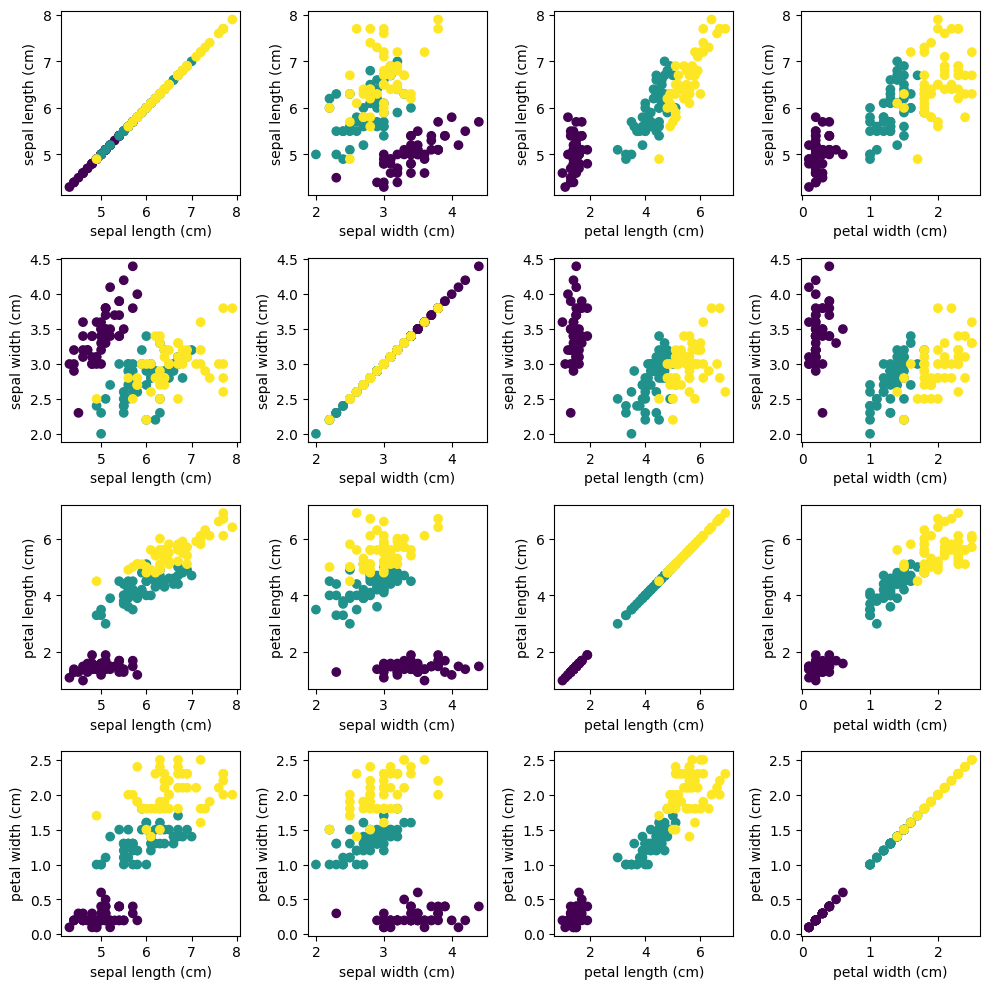

In [17]:
# Plot Iris dataset
# 0: Sepal Length
# 1: Sepal Width
# 2: Petal Length
# 3: Petal Width

fig = plt.figure(figsize=(10, 10))
for iy in range(4):
    for ix in range(4):
        pad = ix + 4 * iy
        axis = fig.add_subplot(4, 4, pad + 1)
        axis.scatter(x[:, ix],x[:, iy],c=iris.target)
        axis.set_xlabel(iris.feature_names[ix])
        axis.set_ylabel(iris.feature_names[iy])
plt.tight_layout()
plt.show()

In [18]:
K = len(np.unique(y))
print(K)

# Prepare Y 
Y = np.zeros((len(y),K))
print(Y.shape)
for ix in range(len(y)):
    for iy in range(K):
        if y[ix] == iy:
            Y[ix,iy] = 1
print(Y[:5])

3
(150, 3)
[[1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]]


In [19]:
D = x.shape[1]
W = np.random.randn(D,K)
b = np.zeros((1,K))

niter = 500
loss_history = []
W_history = []
b_history = []
lr = 0.1
for iter in range(niter):

    Z = x @ W  + b
    #print(Z.shape)
    # Probability Matrix (N,K)
    Z_shift = Z - np.max(Z, axis=1, keepdims=True)
    E = np.exp(Z_shift)
    P = E / np.sum(E,axis=1, keepdims=True)
    #print(P.shape)
    #print(P[:10])
    #print(np.sum(P[:5], axis=1))
    # Compute the loss
    loss = 0.0
    for i in range(len(y)):
        for k in range(K):
            loss -= Y[i,k] * np.log(P[i,k] + 1e-15)
    loss /= len(y)
    loss_history.append(loss)
    G = P - Y
    G /= len(y)
    # Compute gradients
    dW = x.T @ G
    db = np.sum(G,axis=0,keepdims=True)
    W -= lr * dW
    b -= lr * db
    W_history.append(W.copy())
    b_history.append(b.copy())

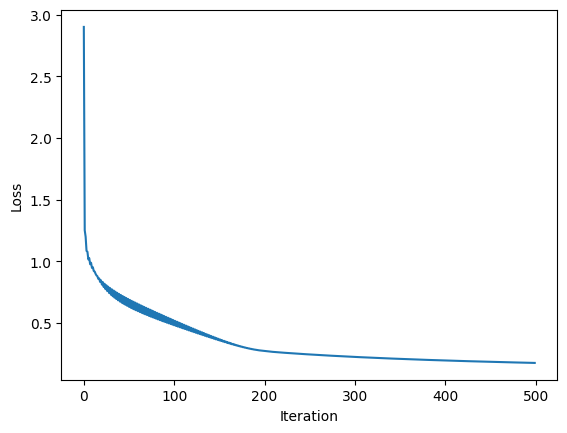

In [20]:
plt.plot(loss_history)
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

In [21]:
y_pred = np.argmax(P, axis=1)
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [22]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [23]:
accuracy = np.mean(y_pred == y)
print("Accuracy:", accuracy)

Accuracy: 0.9733333333333334


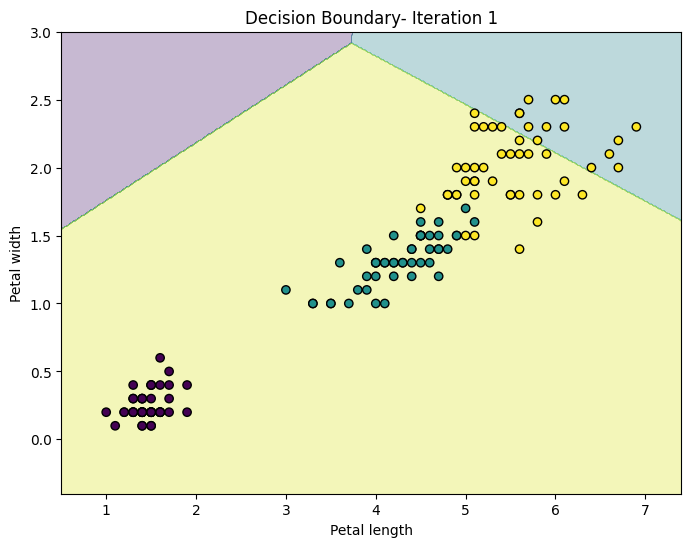

In [24]:
from matplotlib.animation import FuncAnimation

# Fix sepal length and sepal width to its mean value
sepal_length = np.mean(x[:, 0])
sepal_width  = np.mean(x[:, 1])

# Vary petal length and petal width
petal_length = np.linspace(x[:, 2].min() - 0.5, x[:, 2].max() + 0.5, 500)
petal_width = np.linspace(x[:, 3].min() - 0.5,x[:, 3].max() + 0.5, 500)

xx1, xx2 = np.meshgrid(petal_length, petal_width)

# Construct 4D points
X_grid = np.column_stack([
    np.full(xx1.size, sepal_length),  # x1 fixed
    np.full(xx1.size, sepal_width),   # x2 fixed
    xx1.ravel(),                       # x3 varies
    xx2.ravel()                        # x4 varies
])

fig, ax = plt.subplots(figsize=(8, 6))

def animate(iteration):

    # Clear previous frame
    ax.clear()

    W_current = W_history[iteration]
    b_current = b_history[iteration]

    #scores
    Z_grid = X_grid @ W_current + b_current

    # Predicted class use just Z
    y_grid = np.argmax(Z_grid, axis=1)
    y_grid = y_grid.reshape(xx1.shape)

    ax.contourf(xx1,xx2,y_grid,alpha=0.3)
    ax.scatter(x[:, 2],x[:, 3],c=y,edgecolor="black")

    ax.set_xlabel("Petal length")
    ax.set_ylabel("Petal width")
    #ax.set_xlim(petal_length.min(), petal_length.max())
    #ax.set_ylim(petal_width.min(), petal_width.max())

    ax.set_title(f"Decision Boundary- Iteration {iteration + 1}")


anim = FuncAnimation(fig,animate,frames=range(0, len(W_history), 10),interval=100)
anim.save("multiclass_logistic_boundary.gif")
from IPython.display import HTML
HTML(anim.to_jshtml())
